<a href="https://colab.research.google.com/github/berasouvik9/ML_from_Scratch/blob/master/Assignment4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Q1**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Q1**

**Data Preprocessing**

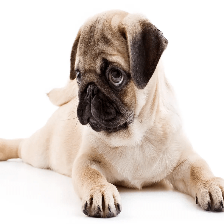

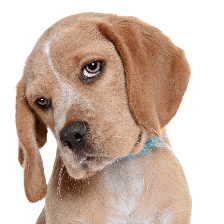

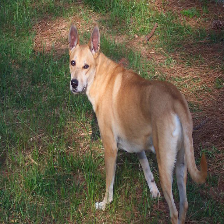

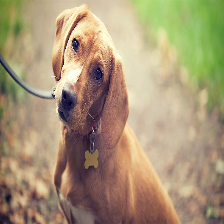

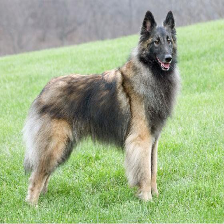

...

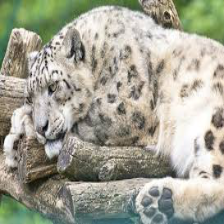

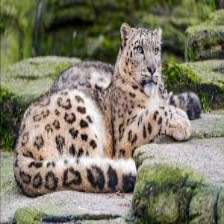

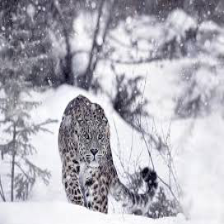

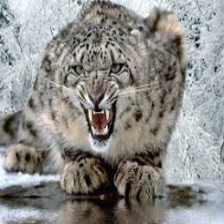

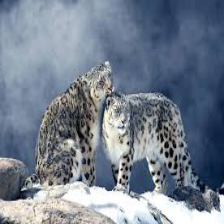

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, DepthwiseConv2D,ZeroPadding2D, GlobalAveragePooling2D, concatenate, Dense,Flatten, MaxPooling2D, ReLU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.initializers import VarianceScaling,Zeros,Ones
from tensorflow.keras.layers import ReLU
import os
import cv2
from google.colab.patches import cv2_imshow

x_train=[]
train_path='/content/drive/MyDrive/ML assignment 4/train'
for folder in os.listdir(train_path):
    sub_path=train_path+"/"+folder
    for img in os.listdir(sub_path):
        image_path=sub_path+"/"+img
        img_arr=cv2.imread(image_path)
        img_arr=cv2.resize(img_arr,(224,224))
        cv2_imshow(img_arr)
        x_train.append(img_arr)
train_x=np.array(x_train)
x_train = train_x.astype('float32')
x_train=train_x/255.0
y_train=[]
for i in range(0,60):
  if i<=29:y_train.append([1,0])
  else:y_train.append([0,1])
y_train=np.array(y_train)


**Baseline** **CNN**

In [2]:
model=Sequential()
model.add(Input(shape=(224,224,3)))
model.add(ZeroPadding2D(padding=1,data_format='channels_last'))
model.add(Conv2D(filters=256,kernel_size=(3,3),strides=1,padding='same',activation='relu'))
model.add(MaxPooling2D(data_format='channels_last'))
model.add(Flatten(name='flatten'))
model.add(Dense(units=50,activation='relu'))
model.add(Dense(units=2,activation='softmax'))
loss=tf.keras.losses.BinaryCrossentropy()
model.compile(optimizer=Adam(learning_rate=0.0001),loss=loss,metrics=['accuracy'])
model.fit(x_train,y_train,epochs=20)

Epoch 1/20
2/2 [==============================] - 5s 1s/step - loss: 1.8008 - accuracy: 0.5000
Epoch 2/20
2/2 [==============================] - 0s 180ms/step - loss: 2.6097 - accuracy: 0.5000
Epoch 3/20
2/2 [==============================] - 0s 176ms/step - loss: 1.2902 - accuracy: 0.6167
Epoch 4/20
2/2 [==============================] - 0s 179ms/step - loss: 0.9251 - accuracy: 0.6667
Epoch 5/20
2/2 [==============================] - 0s 177ms/step - loss: 0.7721 - accuracy: 0.7167
Epoch 6/20
2/2 [==============================] - 0s 188ms/step - loss: 0.5253 - accuracy: 0.8167
Epoch 7/20
2/2 [==============================] - 0s 179ms/step - loss: 0.4374 - accuracy: 0.8167
Epoch 8/20
2/2 [==============================] - 0s 179ms/step - loss: 0.5028 - accuracy: 0.7667
Epoch 9/20
2/2 [==============================] - 0s 178ms/step - loss: 0.2448 - accuracy: 0.9167
Epoch 10/20
2/2 [==============================] - 0s 179ms/step - loss: 0.2924 - accuracy: 0.8333
Epoch 11/20
2/2 [=====

**Classification Baseline CNN**

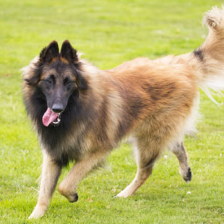

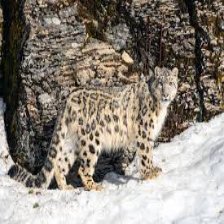

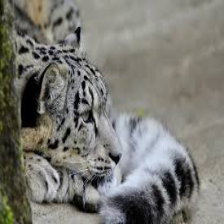

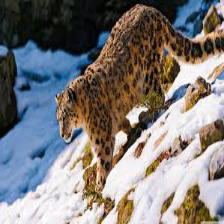

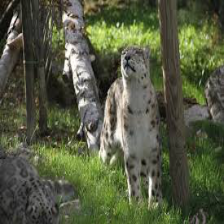

...

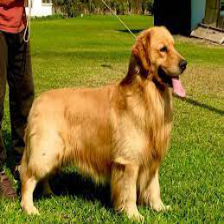

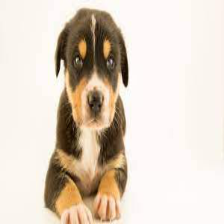

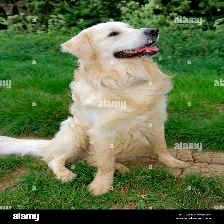

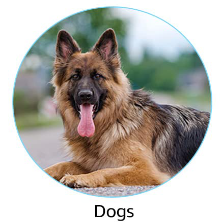

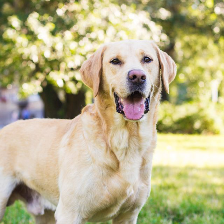

Dog
Snow Leopard
Snow Leopard
Snow Leopard
Dog
Dog
Dog
Snow Leopard
Dog
Snow Leopard
Snow Leopard
Dog
Dog
Snow Leopard
Dog
Dog
Dog
Dog
Snow Leopard
Dog


In [3]:
from PIL import Image, ImageOps
from google.colab.patches import cv2_imshow
x_test=[]
test_path='/content/drive/MyDrive/ML assignment 4/test'
for img in os.listdir(test_path):
    image_path=test_path+"/"+img
    img_arr=cv2.imread(image_path)
    img_arr=cv2.resize(img_arr,(224,224))
    cv2_imshow(img_arr)
    x_test.append(img_arr)
x_test=np.array(x_test)
x_test=x_test/255.0
y_pred=model.predict(x_test)
for i,data in enumerate(y_pred):
  if data[0]>data[1]:
    print('Dog')
  else: print('Snow Leopard')

**VGG Network**

In [4]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, DepthwiseConv2D,ZeroPadding2D, GlobalAveragePooling2D, concatenate, Dense,MaxPooling2D,Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.initializers import VarianceScaling,Zeros,Ones
from tensorflow.keras.layers import ReLU
import os
import cv2

ip = Input(shape=(224,224,3))
x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1')(ip)
x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool')(x)

x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1')(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool')(x)

x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1')(x)
x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2')(x)
x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool')(x)

x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool')(x)

x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool')(x)

x = Flatten(name='flatten')(x)
x = Dense(4096, activation='relu', name='fc1')(x)
x = Dense(512, activation='relu', name='fc2')(x)
out = Dense(2, activation='softmax', name='predictions')(x)

modelVGG=tf.keras.Model(inputs=ip,outputs=out)
loss=tf.keras.losses.CategoricalCrossentropy()
modelVGG.compile(optimizer=Adam(learning_rate=0.000001),loss=loss,metrics=['accuracy'])
modelVGG.fit(x_train,y_train,epochs=20)

Epoch 1/20
2/2 [==============================] - 15s 6s/step - loss: 0.6931 - accuracy: 0.4833
Epoch 2/20
2/2 [==============================] - 1s 389ms/step - loss: 0.6930 - accuracy: 0.6000
Epoch 3/20
2/2 [==============================] - 1s 393ms/step - loss: 0.6930 - accuracy: 0.6167
Epoch 4/20
2/2 [==============================] - 1s 384ms/step - loss: 0.6929 - accuracy: 0.7167
Epoch 5/20
2/2 [==============================] - 1s 383ms/step - loss: 0.6928 - accuracy: 0.7500
Epoch 6/20
2/2 [==============================] - 1s 384ms/step - loss: 0.6928 - accuracy: 0.7333
Epoch 7/20
2/2 [==============================] - 1s 388ms/step - loss: 0.6927 - accuracy: 0.7833
Epoch 8/20
2/2 [==============================] - 1s 390ms/step - loss: 0.6927 - accuracy: 0.7667
Epoch 9/20
2/2 [==============================] - 1s 388ms/step - loss: 0.6926 - accuracy: 0.7500
Epoch 10/20
2/2 [==============================] - 1s 387ms/step - loss: 0.6925 - accuracy: 0.7667
Epoch 11/20
2/2 [====

**Classification VGG**

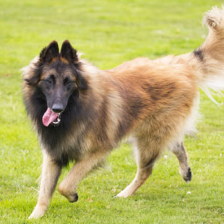

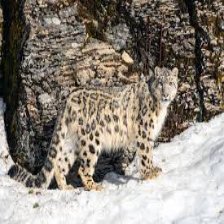

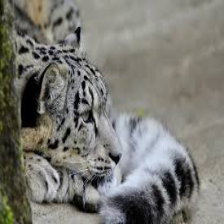

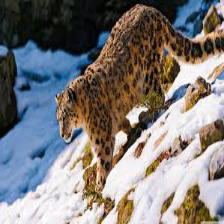

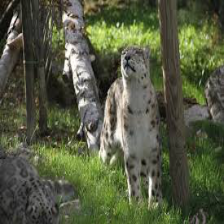

...

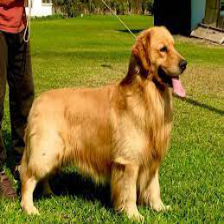

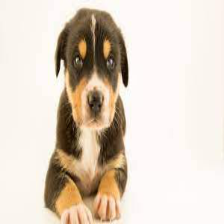

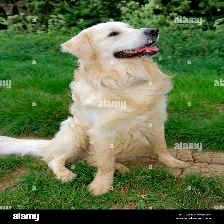

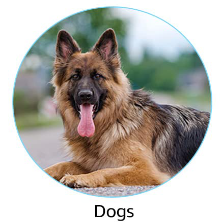

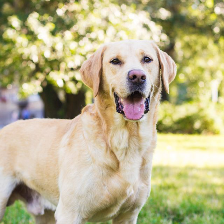

Dog
Snow Leopard
Snow Leopard
Snow Leopard
Snow Leopard
Dog
Snow Leopard
Snow Leopard
Snow Leopard
Snow Leopard
Snow Leopard
Snow Leopard
Snow Leopard
Snow Leopard
Snow Leopard
Dog
Snow Leopard
Snow Leopard
Snow Leopard
Snow Leopard


In [5]:
from PIL import Image, ImageOps
from google.colab.patches import cv2_imshow
x_test=[]
test_path='/content/drive/MyDrive/ML assignment 4/test'
for img in os.listdir(test_path):
    image_path=test_path+"/"+img
    img_arr=cv2.imread(image_path)
    img_arr=cv2.resize(img_arr,(224,224))
    cv2_imshow(img_arr)
    x_test.append(img_arr)
x_test=np.array(x_test)
x_test=x_test/255.0
y_pred=modelVGG.predict(x_test)
for i,data in enumerate(y_pred):
  if data[0]>data[1]:
    print('Dog')
  else: print('Snow Leopard')

**VGG+ Data Augmentation**

In [15]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, DepthwiseConv2D,ZeroPadding2D, GlobalAveragePooling2D, concatenate, Dense,Flatten, MaxPooling2D, ReLU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.initializers import VarianceScaling,Zeros,Ones
from tensorflow.keras.layers import ReLU
import os
import cv2

x_train=[]
train_path='/content/drive/MyDrive/ML assignment 4/train'
for folder in os.listdir(train_path):
    sub_path=train_path+"/"+folder
    for img in os.listdir(sub_path):
        image_path=sub_path+"/"+img
        img_arr=cv2.imread(image_path)
        img_arr=cv2.resize(img_arr,(224,224))
        x_train.append(img_arr)
x_train=np.array(x_train)

y_train=[]
for i in range(0,60):
  if i<=29:y_train.append([1,0])
  else:y_train.append([0,1])
y_train=np.array(y_train)


train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        featurewise_center=True,
        featurewise_std_normalization=True,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        horizontal_flip=True)

train_generator = train_datagen.flow(
        x_train,y_train)


ip = Input(shape=(224,224,3))
x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1')(ip)
x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool')(x)

x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1')(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool')(x)

x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1')(x)
x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2')(x)
x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool')(x)

x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool')(x)

x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool')(x)

x = Flatten(name='flatten')(x)
x = Dense(4096, activation='relu', name='fc1')(x)
x = Dense(512, activation='relu', name='fc2')(x)
out = Dense(2, activation='softmax', name='predictions')(x)

modelVGG_Aug=tf.keras.Model(inputs=ip,outputs=out)
loss=tf.keras.losses.CategoricalCrossentropy()
modelVGG_Aug.compile(optimizer=Adam(learning_rate=0.0001),loss=loss,metrics=['accuracy'])
modelVGG_Aug.fit(train_generator,epochs=20)

/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:728: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


Epoch 1/20
2/2 [==============================] - 2s 424ms/step - loss: 0.6933 - accuracy: 0.4667
Epoch 2/20
2/2 [==============================] - 1s 387ms/step - loss: 0.6925 - accuracy: 0.4833
Epoch 3/20
2/2 [==============================] - 1s 395ms/step - loss: 0.6845 - accuracy: 0.7167
Epoch 4/20
2/2 [==============================] - 1s 397ms/step - loss: 0.6781 - accuracy: 0.5333
Epoch 5/20
2/2 [==============================] - 1s 538ms/step - loss: 0.6534 - accuracy: 0.6167
Epoch 6/20
2/2 [==============================] - 1s 407ms/step - loss: 0.5429 - accuracy: 0.7833
Epoch 7/20
2/2 [==============================] - 1s 521ms/step - loss: 0.6288 - accuracy: 0.6667
Epoch 8/20
2/2 [==============================] - 1s 534ms/step - loss: 0.4891 - accuracy: 0.7833
Epoch 9/20
2/2 [==============================] - 1s 401ms/step - loss: 0.4925 - accuracy: 0.8667
Epoch 10/20
2/2 [==============================] - 1s 538ms/step - loss: 0.4666 - accuracy: 0.7500
Epoch 11/20
2/2 [==

**Classification VGG+Data Augmentation**

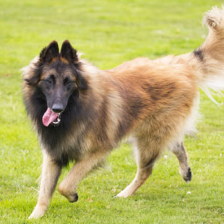

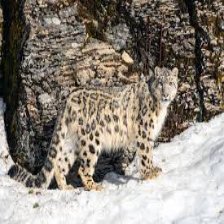

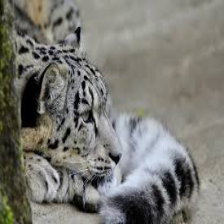

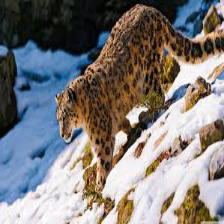

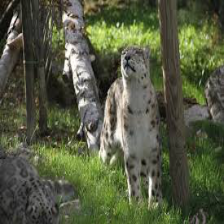

...

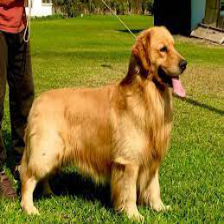

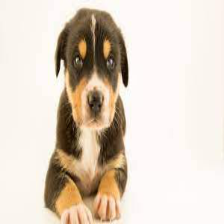

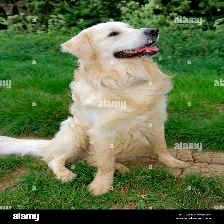

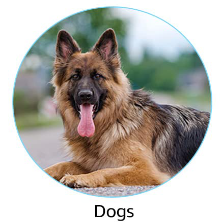

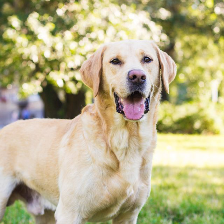

[[9.9598771e-01 4.0122475e-03]
 [7.2001219e-02 9.2799878e-01]
 [9.0698592e-02 9.0930140e-01]
 [7.8386390e-01 2.1613613e-01]
 [6.9366825e-01 3.0633172e-01]
 [7.2875905e-01 2.7124089e-01]
 [7.9096550e-01 2.0903450e-01]
 [8.1380174e-02 9.1861975e-01]
 [8.7154162e-01 1.2845843e-01]
 [4.9400993e-02 9.5059907e-01]
 [4.7904828e-01 5.2095175e-01]
 [2.4011336e-01 7.5988662e-01]
 [9.2442238e-01 7.5577609e-02]
 [9.5585626e-01 4.4143740e-02]
 [9.4979078e-01 5.0209273e-02]
 [9.9967289e-01 3.2715860e-04]
 [8.9187229e-01 1.0812779e-01]
 [8.4862894e-01 1.5137106e-01]
 [8.7448448e-01 1.2551545e-01]
 [9.4258887e-01 5.7411123e-02]]
Dog
Snow Leopard
Snow Leopard
Dog
Dog
Dog
Dog
Snow Leopard
Dog
Snow Leopard
Snow Leopard
Snow Leopard
Dog
Dog
Dog
Dog
Dog
Dog
Dog
Dog


In [16]:
x_test=[]
test_path='/content/drive/MyDrive/ML assignment 4/test'
for img in os.listdir(test_path):
    image_path=test_path+"/"+img
    img_arr=cv2.imread(image_path)
    img_arr=cv2.resize(img_arr,(224,224))
    cv2_imshow(img_arr)
    x_test.append(img_arr)
x_test=np.array(x_test)
x_test=x_test/255.0
y_pred=modelVGG_Aug.predict(x_test)
print(y_pred)
for i,data in enumerate(y_pred):
  if data[0]>data[1]:
    print('Dog')
  else: print('Snow Leopard')

**Q2 with varying N** 


(75, 4)
(0, 4)
iteration= 1
loss= tf.Tensor(nan, shape=(), dtype=float64)
(1, 4)
iteration= 1
loss= tf.Tensor(1.048147073968205, shape=(), dtype=float64)
(2, 4)
iteration= 1
loss= tf.Tensor(1.0481470739682048, shape=(), dtype=float64)
(3, 4)
iteration= 1
loss= tf.Tensor(1.0481470739682048, shape=(), dtype=float64)
(4, 4)
iteration= 1
loss= tf.Tensor(1.0481470739682048, shape=(), dtype=float64)
(5, 4)
iteration= 1
loss= tf.Tensor(1.0481470739682048, shape=(), dtype=float64)
(6, 4)
iteration= 1
loss= tf.Tensor(1.0481470739682048, shape=(), dtype=float64)
(7, 4)
iteration= 1
loss= tf.Tensor(1.0481470739682048, shape=(), dtype=float64)
(8, 4)
iteration= 1
loss= tf.Tensor(1.0481470739682048, shape=(), dtype=float64)
(9, 4)
iteration= 1
loss= tf.Tensor(1.0481470739682048, shape=(), dtype=float64)
(10, 4)
iteration= 1
loss= tf.Tensor(1.0481470739682048, shape=(), dtype=float64)
(11, 4)
iteration= 1
loss= tf.Tensor(1.0481470739682048, shape=(), dtype=float64)
(12, 4)
iteration= 1
loss= tf.Tens

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


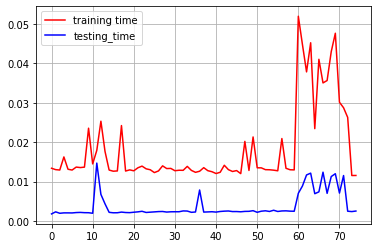

In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.model_selection import StratifiedKFold
import timeit as time
class Multi_Log_Reg():
  def __init__(self,lambda_,X,y):
    self.X=tf.constant(X,dtype=tf.float32)
    self.X=tf.cast(self.X,dtype=tf.float64)
    self.y=tf.constant(y,dtype=tf.float32)
    self.y=tf.cast(self.y,dtype=tf.float64)
    #ordinate=tf.constant(tf.ones([self.X.shape[0],1]))
    #ordinate=tf.cast(ordinate,tf.float64)
    #self.X=tf.concat([ordinate,self.X],axis=1)
    self.theta=tf.Variable(tf.ones([self.y.shape[1],self.X.shape[1]],dtype=tf.float64),dtype=tf.float64)
    self.lambda_=tf.constant(lambda_,dtype=tf.float64)                           
  
  def fit(self,lr,y,i):
    y=tf.constant(y,dtype=tf.float64)
    y_hat=[]
    loss1=0
    with tf.GradientTape() as tape:
      tape.watch(self.theta)
      y_hat=self.softmax(self.X,self.theta)
      r=tf.math.multiply(-1,tf.math.log(y_hat))
      T1=tf.tensordot(r,tf.transpose(y),axes=1)
      pl=tf.linalg.tensor_diag_part(T1)
      loss=tf.math.add(tf.math.divide(tf.math.reduce_sum(pl,axis=0),len(y)),tf.math.multiply(self.lambda_,self.L2norm(self.theta)))
    gradients=tape.gradient(loss,self.theta)
    self.theta=tf.math.subtract(self.theta,tf.math.multiply(lr,gradients))
    return y_hat,loss
  
  def L2norm(self,X):
    t=tf.tensordot(X,tf.transpose(X),axes=1)
    t=tf.linalg.tensor_diag_part(t)
    t=tf.math.reduce_sum(t,axis=0)
    return t
  
  def sigmoid(self,X):
    y=tf.math.divide(tf.cast(1.0,tf.float64),(tf.math.add(tf.cast(1.0,tf.float64),tf.math.exp(-X))))
    y=tf.sigmoid(X)
    return y

  def softmax(self,X,theta):
    mat=tf.tensordot(X,tf.transpose(theta),axes=1)
    mat=tf.math.exp(mat)
    sum=tf.math.reduce_sum(mat,axis=1)
    res_sum=tf.reshape(sum,(sum.shape[0],1))
    y=tf.truediv(mat,res_sum)
    return y

  def predict(self,X):
    y=[]
    u=np.zeros([X.shape[0],X.shape[1]])
    y=self.softmax(X,self.theta)
    y=y.numpy()
    y=np.array(y)
    for j,data in enumerate(y):
      k=np.argmax(y[j])
      for i in range(0,X.shape[1]):
        if i==k:u[j,i]=1
        else:u[j,i]=0
    return u

  def reencode(self,X):
    X=X.numpy()
    u=np.zeros([X.shape[0],X.shape[1]])
    for j,data in enumerate(X):
      k=np.argmax(X[j])
      for i in range(0,X.shape[1]):
        if i==k:u[j,i]=1
        else:u[j,i]=0
    return u

  def accuracy(self,y,y_hat):
    c=0
    #y_hat=y_hat.numpy()
    y=y.numpy()
    u=np.zeros([y_hat.shape[0],y_hat.shape[1]])
    for j,data in enumerate(y_hat):
      k=np.argmax(y_hat[j])
      for i in range(0,y_hat.shape[1]):
        if i==k:u[j,i]=1
        else:u[j,i]=0
    for j,dt in enumerate(u):
      if y[j].all()==dt.all():
        c+=1
    print(len(y))
    return c/len(y)

def encode(x):
  h=len(np.unique(x))
  d=np.zeros([x.shape[0],h])
  for i,data in enumerate(x):
    for j in range(0,d.shape[1]):
      if data==j:
        d[i,j]=1
  return d

lambda_= 0
X, Y = load_iris(return_X_y=True)

skf=StratifiedKFold(n_splits=2, random_state=None, shuffle=True)
for train_index, test_index in skf.split(X, Y):
  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = Y[train_index], Y[test_index]
y_train=encode(y_train)
y_test=encode(y_test)
print(X_train.shape)
X_train,y_train,X_test,y_test=np.array(X_train),np.array(y_train),np.array(X_test),np.array(y_test)
#X_train,X_test=X_train[:,:2],X_test[:,:2]
y_train,y_test=y_train.reshape(y_train.shape[0],y_train.shape[1]),y_test.reshape(y_test.shape[0],y_test.shape[1])
clf=Multi_Log_Reg(lambda_,X_train,y_train)
iters=1
error=tf.constant(0.0,dtype=tf.float64)
learning_rate=0.001
y_train_pred=[]
y_true=[]
acc_train,acc_test=[],0.0
accuracy_train=0.0
e=[]
loss=[]
time_trainN=[]
time_testN=[]
for i in range(0,X_train.shape[0]):
  clf=Multi_Log_Reg(lambda_,X_train[0:i],y_train[0:i])
  start,stop=0,0
  for j in range(1,iters+1):
    start=time.default_timer()
    y_train_preds,l=clf.fit(learning_rate,y_train[0:i],j)
    stop=time.default_timer()
    y_train_pred.append(y_train_preds)
    loss.append(l**0.5)
    print('iteration=',j)
    print('loss=',l**0.5)
    starttest=time.default_timer()
    y_test_pred=clf.predict(X_test[0:i])
    stoptest=time.default_timer()
    time_trainN.append(stop-start)
    time_testN.append(stoptest-starttest)

loss=np.array(loss)
accuracy_train=np.mean(acc_train)

plt.plot(time_trainN,color='red')
plt.plot(time_testN,color='blue')
plt.legend(['training time','testing_time'])
plt.grid()


**Q2 with varying D**

iteration= 1
loss= tf.Tensor(1.048147073968205, shape=(), dtype=float64)
iteration= 1
loss= tf.Tensor(1.0481470739682048, shape=(), dtype=float64)
iteration= 1
loss= tf.Tensor(1.0481470739682048, shape=(), dtype=float64)
iteration= 1
loss= tf.Tensor(1.0481470739682048, shape=(), dtype=float64)


/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


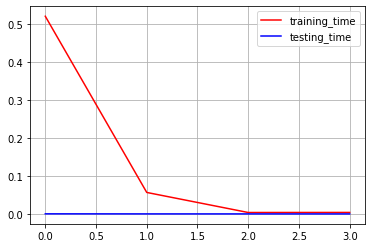

In [17]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.model_selection import StratifiedKFold
import timeit as time
class Multi_Log_Reg():
  def __init__(self,lambda_,X,y):
    self.X=tf.constant(X,dtype=tf.float32)
    self.X=tf.cast(self.X,dtype=tf.float64)
    self.y=tf.constant(y,dtype=tf.float32)
    self.y=tf.cast(self.y,dtype=tf.float64)
    #ordinate=tf.constant(tf.ones([self.X.shape[0],1]))
    #ordinate=tf.cast(ordinate,tf.float64)
    #self.X=tf.concat([ordinate,self.X],axis=1)
    self.theta=tf.Variable(tf.ones([self.y.shape[1],self.X.shape[1]],dtype=tf.float64),dtype=tf.float64)
    self.lambda_=tf.constant(lambda_,dtype=tf.float64)                           
  
  def fit(self,lr,y,i):
    y=tf.constant(y,dtype=tf.float64)
    y_hat=[]
    loss1=0
    with tf.GradientTape() as tape:
      tape.watch(self.theta)
      y_hat=self.softmax(self.X,self.theta)
      r=tf.math.multiply(-1,tf.math.log(y_hat))
      T1=tf.tensordot(r,tf.transpose(y),axes=1)
      pl=tf.linalg.tensor_diag_part(T1)
      loss=tf.math.add(tf.math.divide(tf.math.reduce_sum(pl,axis=0),len(y)),tf.math.multiply(self.lambda_,self.L2norm(self.theta)))
    gradients=tape.gradient(loss,self.theta)
    self.theta=tf.math.subtract(self.theta,tf.math.multiply(lr,gradients))
    return y_hat,loss
  
  def L2norm(self,X):
    t=tf.tensordot(X,tf.transpose(X),axes=1)
    t=tf.linalg.tensor_diag_part(t)
    t=tf.math.reduce_sum(t,axis=0)
    return t
  
  def sigmoid(self,X):
    y=tf.math.divide(tf.cast(1.0,tf.float64),(tf.math.add(tf.cast(1.0,tf.float64),tf.math.exp(-X))))
    y=tf.sigmoid(X)
    return y

  def softmax(self,X,theta):
    mat=tf.tensordot(X,tf.transpose(theta),axes=1)
    mat=tf.math.exp(mat)
    sum=tf.math.reduce_sum(mat,axis=1)
    res_sum=tf.reshape(sum,(sum.shape[0],1))
    y=tf.truediv(mat,res_sum)
    return y

  def predict(self,X):
    y=[]
    u=np.zeros([X.shape[0],X.shape[1]])
    y=self.softmax(X,self.theta)
    y=y.numpy()
    y=np.array(y)
    for j,data in enumerate(y):
      k=np.argmax(y[j])
      for i in range(0,X.shape[1]):
        if i==k:u[j,i]=1
        else:u[j,i]=0
    return u

  def reencode(self,X):
    X=X.numpy()
    u=np.zeros([X.shape[0],X.shape[1]])
    for j,data in enumerate(X):
      k=np.argmax(X[j])
      for i in range(0,X.shape[1]):
        if i==k:u[j,i]=1
        else:u[j,i]=0
    return u

  def accuracy(self,y,y_hat):
    c=0
    #y_hat=y_hat.numpy()
    y=y.numpy()
    u=np.zeros([y_hat.shape[0],y_hat.shape[1]])
    for j,data in enumerate(y_hat):
      k=np.argmax(y_hat[j])
      for i in range(0,y_hat.shape[1]):
        if i==k:u[j,i]=1
        else:u[j,i]=0
    for j,dt in enumerate(u):
      if y[j].all()==dt.all():
        c+=1
    return c/len(y)

def encode(x):
  h=len(np.unique(x))
  d=np.zeros([x.shape[0],h])
  for i,data in enumerate(x):
    for j in range(0,d.shape[1]):
      if data==j:
        d[i,j]=1
  return d

lambda_=0
X, Y = load_iris(return_X_y=True)

skf=StratifiedKFold(n_splits=2, random_state=None, shuffle=True)
for train_index, test_index in skf.split(X, Y):
  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = Y[train_index], Y[test_index]
y_train=encode(y_train)
y_test=encode(y_test)
X_train,y_train,X_test,y_test=np.array(X_train),np.array(y_train),np.array(X_test),np.array(y_test)
#X_train,X_test=X_train[:,:2],X_test[:,:2]
y_train,y_test=y_train.reshape(y_train.shape[0],y_train.shape[1]),y_test.reshape(y_test.shape[0],y_test.shape[1])
clf=Multi_Log_Reg(lambda_,X_train,y_train)
iters=1
error=tf.constant(0.0,dtype=tf.float64)
learning_rate=0.001
y_train_pred=[]
y_true=[]
acc_train,acc_test=[],0.0
accuracy_train=0.0
e=[]
loss=[]
time_trainD=[]
time_testD=[]
for i in range(0,X_train.shape[1]):
  clf=Multi_Log_Reg(lambda_,X_train[:,0:i],y_train)
  start,stop=0,0
  start=time.default_timer()
  for j in range(1,iters+1):
    y_train_preds,l=clf.fit(learning_rate,y_train,j)
    stop=time.default_timer()
    y_train_pred.append(y_train_preds)
    loss.append(l**0.5)
    print('iteration=',j)
    print('loss=',l**0.5)
    startt1=time.default_timer()
    y_test_pred=clf.predict(X_test[:,0:i])
    stopt1=time.default_timer()
    time_trainD.append(stop-start)
    time_testD.append(stopt1-startt1)

loss=np.array(loss)
accuracy_train=np.mean(acc_train)
plt.plot(time_trainD,color='red')
plt.plot(time_testD,color='blue')
plt.legend(['training_time','testing_time'])
plt.grid()

**Q3**

**Data Preprocessing**

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, DepthwiseConv2D,ZeroPadding2D, GlobalAveragePooling2D, concatenate, Dense,Flatten, MaxPooling2D, ReLU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.initializers import VarianceScaling,Zeros,Ones
from tensorflow.keras.layers import ReLU
import os
import cv2
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()
print(x_train.shape)
x_train=x_train.reshape(x_train.shape[0],x_train.shape[1],x_train.shape[2],1)
x_train = x_train.astype('float32')
x_train/=255.0
y_train = tf.keras.utils.to_categorical(y_train)
x_test=x_test.reshape(x_test.shape[0],x_test.shape[1],x_test.shape[2],1)
x_test = x_test.astype('float32')
x_test/=255.0
y_test = tf.keras.utils.to_categorical(y_test)


(60000, 28, 28)


**Model building CNN**

In [ ]:
modelCNN=Sequential()
modelCNN.add(Input(shape=(x_train.shape[1],x_train.shape[2],1)))
modelCNN.add(ZeroPadding2D(padding=1,data_format='channels_last'))
modelCNN.add(Conv2D(filters=120,kernel_size=(3,3),strides=1,padding='same',activation='relu'))
modelCNN.add(MaxPooling2D(data_format='channels_last'))
modelCNN.add(Flatten(name='flatten'))
modelCNN.add(Dense(units=100,activation='relu'))
modelCNN.add(Dense(units=10,activation='softmax'))
loss=tf.keras.losses.CategoricalCrossentropy()
modelCNN.compile(optimizer=Adam(learning_rate=0.001),loss=loss,metrics=['accuracy'])
modelCNN.fit(x_train,y_train,epochs=5)


Epoch 1/5
1875/1875 [==============================] - 20s 10ms/step - loss: 0.1311 - accuracy: 0.9600
Epoch 2/5
1875/1875 [==============================] - 14s 7ms/step - loss: 0.0467 - accuracy: 0.9857
Epoch 3/5
1875/1875 [==============================] - 14s 8ms/step - loss: 0.0271 - accuracy: 0.9916
Epoch 4/5
1875/1875 [==============================] - 14s 8ms/step - loss: 0.0177 - accuracy: 0.9943
Epoch 5/5
1875/1875 [==============================] - 14s 7ms/step - loss: 0.0135 - accuracy: 0.9955


**Classification**

(10000, 10)


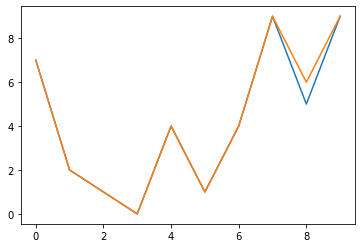

In [ ]:
y_pred=modelCNN.predict(x_test)
print(y_test.shape)
plt.plot(np.argmax(y_test,axis=1)[:10])
plt.plot(np.argmax(y_pred,axis=1)[:10])

**Model Building MLP**

In [ ]:
modelMLP=Sequential()
modelMLP.add(Input(shape=(x_train.shape[1],x_train.shape[2],1)))
modelMLP.add(Flatten(name='flatten'))
modelMLP.add(Dense(units=1508,activation='relu'))
modelMLP.add(Dense(units=1000,activation='relu'))
modelMLP.add(Dense(units=10,activation='softmax'))
loss=tf.keras.losses.CategoricalCrossentropy()
modelMLP.compile(optimizer=Adam(learning_rate=0.001),loss=loss,metrics=['accuracy'])
modelMLP.fit(x_train,y_train,epochs=5)


Epoch 1/5
1875/1875 [==============================] - 16s 8ms/step - loss: 0.1779 - accuracy: 0.9460
Epoch 2/5
1875/1875 [==============================] - 12s 7ms/step - loss: 0.0835 - accuracy: 0.9740
Epoch 3/5
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0595 - accuracy: 0.9814
Epoch 4/5
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0454 - accuracy: 0.9857
Epoch 5/5
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0376 - accuracy: 0.9888


**Classification**

(10000, 10)


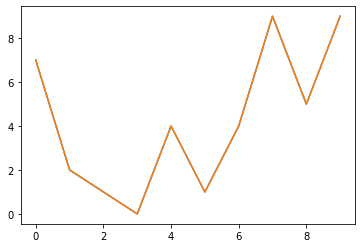

In [ ]:
y_pred=modelMLP.predict(x_test)
print(y_test.shape)
plt.plot(np.argmax(y_test,axis=1)[:10])
plt.plot(np.argmax(y_pred,axis=1)[:10])


**Just for reference purpose No need to include in github**

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, DepthwiseConv2D,ZeroPadding2D, GlobalAveragePooling2D, concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.initializers import VarianceScaling,Zeros,Ones
from tensorflow.keras.layers import ReLU

class ImageClassification():
  def __init__(self,):
    l=0
    self.model=Sequential()

  def submodel(self,fc1,ks1,sc1,kds1,sd1,fc2,ks2,sc2,x1,x2,x3):
    model=Sequential()
    model.add(Input(shape=(x1,x2,x3)))
    model.add(Conv2D(filters=fc1,kernel_size=ks1,strides=sc1,padding='same',data_format='channels_last',dilation_rate=(1,1),kernel_initializer=VarianceScaling(scale=1, mode='fan_avg', distribution='uniform', seed=None),bias_initializer=Zeros(),activation='linear',groups=1))
    model.add(BatchNormalization(axis=3,beta_initializer=Zeros(),center=True,epsilon=0.001,gamma_initializer=Ones(),momentum=0.999,moving_mean_initializer=Zeros(),moving_variance_initializer=Ones(),scale=True))
    model.add(ReLU(max_value=6))
    model.add(DepthwiseConv2D(kernel_size=kds1,strides=sd1,padding='same',data_format='channels_last',dilation_rate=(1,1),depthwise_initializer=VarianceScaling(scale=1, mode='fan_avg', distribution='uniform', seed=None),bias_initializer=Zeros(),activation='linear',depth_multiplier=1,groups=1))
    model.add(BatchNormalization(axis=3,beta_initializer=Zeros(),center=True,epsilon=0.001,gamma_initializer=Ones(),momentum=0.999,moving_mean_initializer=Zeros(),moving_variance_initializer=Ones(),scale=True))
    model.add(ReLU(max_value=6))
    model.add(Conv2D(filters=fc2,kernel_size=ks2,strides=sc2,padding='same',data_format='channels_last',dilation_rate=(1,1),kernel_initializer=VarianceScaling(scale=1, mode='fan_avg', distribution='uniform', seed=None),bias_initializer=Zeros(),activation='linear',groups=1))
    model.add(BatchNormalization(axis=3,beta_initializer=Zeros(),center=True,epsilon=0.001,gamma_initializer=Ones(),momentum=0.999,moving_mean_initializer=Zeros(),moving_variance_initializer=Ones(),scale=True))
    return model

  def string_model1(self,fc1,ks1,sc1,kds1,sd1,fc2,ks2,sc2):
    #model=Sequential()
    self.model.add(Conv2D(filters=fc1,kernel_size=ks1,strides=sc1,padding='same',data_format='channels_last',dilation_rate=(1,1),kernel_initializer=VarianceScaling(scale=1, mode='fan_avg', distribution='uniform', seed=None),bias_initializer=Zeros(),activation='linear',groups=1))
    self.model.add(BatchNormalization(axis=3,beta_initializer=Zeros(),center=True,epsilon=0.001,gamma_initializer=Ones(),momentum=0.999,moving_mean_initializer=Zeros(),moving_variance_initializer=Ones(),scale=True))
    self.model.add(ReLU(max_value=6))
    self.model.add(ZeroPadding2D(padding=((0,1),(0,1)),data_format='channels_last'))
    self.model.add(DepthwiseConv2D(kernel_size=kds1,strides=sd1,padding='same',data_format='channels_last',dilation_rate=(1,1),depthwise_initializer=VarianceScaling(scale=1, mode='fan_avg', distribution='uniform', seed=None),bias_initializer=Zeros(),activation='linear',depth_multiplier=1,groups=1))
    self.model.add(BatchNormalization(axis=3,beta_initializer=Zeros(),center=True,epsilon=0.001,gamma_initializer=Ones(),momentum=0.999,moving_mean_initializer=Zeros(),moving_variance_initializer=Ones(),scale=True))
    self.model.add(ReLU(max_value=6))
    self.model.add(Conv2D(filters=fc2,kernel_size=ks2,strides=sc2,padding='same',data_format='channels_last',dilation_rate=(1,1),kernel_initializer=VarianceScaling(scale=1, mode='fan_avg', distribution='uniform', seed=None),bias_initializer=Zeros(),activation='linear',groups=1))
    self.model.add(BatchNormalization(axis=3,beta_initializer=Zeros(),center=True,epsilon=0.001,gamma_initializer=Ones(),momentum=0.999,moving_mean_initializer=Zeros(),moving_variance_initializer=Ones(),scale=True))
    return model
  
  def string_model2(self,fc1,ks1,sc1,kds1,sd1,fc2,ks2,sc2):
   # model=Sequential()
    self.model.add(Conv2D(filters=fc1,kernel_size=ks1,strides=sc1,padding='same',data_format='channels_last',dilation_rate=(1,1),kernel_initializer=VarianceScaling(scale=1,mode='fan_avg', distribution='uniform', seed=None),bias_initializer=Zeros(),activation='linear',groups=1))
    self.model.add(BatchNormalization(axis=3,beta_initializer=Zeros(),center=True,epsilon=0.001,gamma_initializer=Ones(),momentum=0.999,moving_mean_initializer=Zeros(),moving_variance_initializer=Ones(),scale=True))
    self.model.add(ReLU(max_value=6))
    self.model.add(DepthwiseConv2D(kernel_size=kds1,strides=sd1,padding='same',data_format='channels_last',dilation_rate=(1,1),depthwise_initializer=VarianceScaling(scale=1, mode='fan_avg', distribution='uniform', seed=None),bias_initializer=Zeros(),activation='linear',depth_multiplier=1,groups=1))
    self.model.add(BatchNormalization(axis=3,beta_initializer=Zeros(),center=True,epsilon=0.001,gamma_initializer=Ones(),momentum=0.999,moving_mean_initializer=Zeros(),moving_variance_initializer=Ones(),scale=True))
    self.model.add(ReLU(max_value=6))
    self.model.add(Conv2D(filters=fc2,kernel_size=ks2,strides=sc2,padding='same',data_format='channels_last',dilation_rate=(1,1),kernel_initializer=VarianceScaling(scale=1, mode='fan_avg', distribution='uniform', seed=None),bias_initializer=Zeros(),activation='linear',groups=1))
    self.model.add(BatchNormalization(axis=3,beta_initializer=Zeros(),center=True,epsilon=0.001,gamma_initializer=Ones(),momentum=0.999,moving_mean_initializer=Zeros(),moving_variance_initializer=Ones(),scale=True))

  def main_model(self):
      self.model.add(Input(shape=(224,224,3)))
      self.model.add(ZeroPadding2D(padding=1,data_format='channels_last'))
      #self.model.add(Conv2D(filters=16,kernel_size=3,strides=2,padding='same',data_format='channels_last',dilation_rate=(1,1),kernel_initializer=VarianceScaling(scale=1,mode='fan_avg', distribution='uniform', seed=None),bias_initializer=Zeros(),activation='linear',groups=1))
      self.string_model2(16,3,2,3,1,8,1,1)
      #self.string_model1(48,1,1,3,2,8,1,1)
      self.model.add(concatenate([self.string_model1(48,1,1,3,2,8,1,1),self.submodel(48,1,1,3,1,8,1,1,57,57,8)]))
      #mc1=concatenate([])
      return self.model


obj=ImageClassification()
model=obj.main_model()
model.build()
model.summary()



  
